# Practice Problems 9

In [30]:
import json
from pathlib import Path
import pandas as pd
import numpy as np
import os
import warnings
import kagglehub
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix, recall_score
import matplotlib.pyplot as plt
import seaborn as sns
import shutil
from PIL import Image

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import load_model

## Exercise 1

Download the dataset MM-IMDB from https://www.kaggle.com/johnarevalo/datasets.
Select 2000 images with drama label and 2000 with horror label. Be careful to exclude those images with both labels. Perform a 60%-20%-20% stratified split for training, validation and test datasets.

In [2]:
path = kagglehub.dataset_download("johnarevalo/raw-mmimdb")

print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/raw-mmimdb


We go across the images and check its genres in order to get a labeled dataFrame that refrences the image path

In [3]:
def get_genres(file_path):
  with open(file_path, 'r') as f:
    poster_data = json.load(f)
  return [genre.upper() for genre in poster_data['genres']]

def check_files(df):
  to_check = df['image_path'].values
  c = True
  for path in to_check:
    c = c and os.path.exists(path)
  return c

def get_routes_and_labels(dataset_path):
  routes = []
  labels = []
  path = Path(dataset_path)
  for file in path.iterdir():
      if file.is_file() and file.suffix == '.json':
          genres = get_genres(file)
          horror = "HORROR" in genres
          drama = "DRAMA" in genres
          if (horror != drama):
            routes.append(dataset_path+"/"+str(file.stem)+".jpeg")
            labels.append("Horror" if horror else "Drama")
  return pd.DataFrame({
    'image_path': routes,
    'label': labels
  })

In [4]:
dataset_path = path+"/mmimdb/dataset"
df = get_routes_and_labels(dataset_path)
assert check_files(df) , "Files check failed"

In [5]:
print(df.info())
df.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15624 entries, 0 to 15623
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  15624 non-null  object
 1   label       15624 non-null  object
dtypes: object(2)
memory usage: 244.3+ KB
None


,image_path,label
0,/kaggle/input/raw-mmimdb/mmimdb/dataset/012691...,Drama
1,/kaggle/input/raw-mmimdb/mmimdb/dataset/010139...,Drama
2,/kaggle/input/raw-mmimdb/mmimdb/dataset/026530...,Drama
3,/kaggle/input/raw-mmimdb/mmimdb/dataset/140321...,Drama
4,/kaggle/input/raw-mmimdb/mmimdb/dataset/009318...,Horror


We know see how many images we have for our task and how balanced are the labels

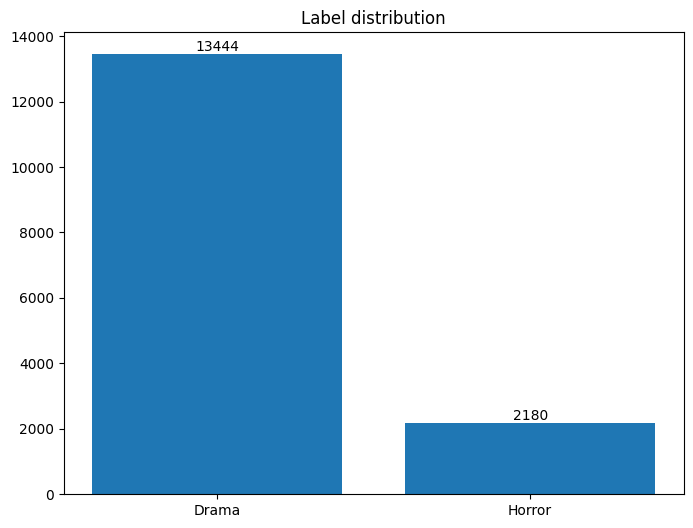

In [6]:
counts = df['label'].value_counts()
labels = counts.index
values = counts.values
plt.figure(figsize=(8, 6))
plt.bar(labels, values)
plt.title("Label distribution")
for i, value in enumerate(values):
    plt.text(i, value + 0.5, str(value), ha='center', va='bottom')

plt.show()

As labels are unbalanced, we will do undersampling in order to get 2000 images per class

In [7]:
df_horror = df[df['label'] == 'Horror'][:2000]
df_drama = df[df['label'] == 'Drama'][:2000]

df = pd.concat([df_horror, df_drama])
df = df.sample(frac=1).reset_index(drop=True)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image_path  4000 non-null   object
 1   label       4000 non-null   object
dtypes: object(2)
memory usage: 62.6+ KB


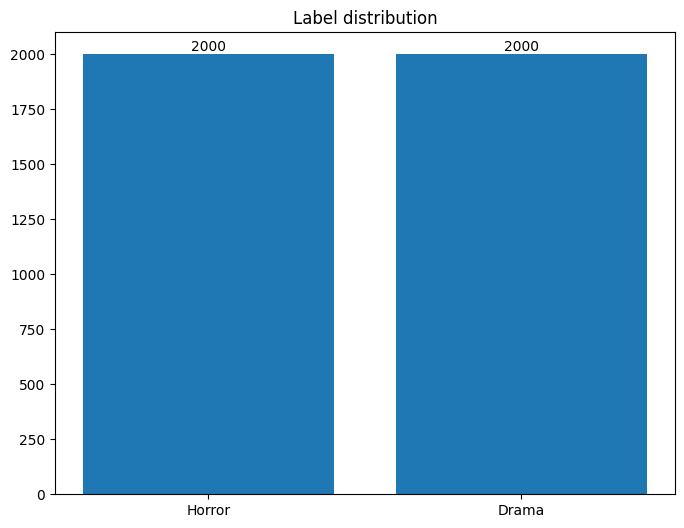

In [9]:
counts = df['label'].value_counts()
labels = counts.index
values = counts.values
plt.figure(figsize=(8, 6))
plt.bar(labels, values)
plt.title("Label distribution")
for i, value in enumerate(values):
    plt.text(i, value + 0.5, str(value), ha='center', va='bottom')

plt.show()

In [10]:
target_dir = '/data'
os.makedirs(target_dir, exist_ok=True)

def copy_and_get_new_path(old_path):
    filename = os.path.basename(old_path)
    new_path = os.path.join(target_dir, filename)
    shutil.copy(old_path, new_path)
    os.chmod(new_path, 0o777)
    return new_path

df['image_path'] = df['image_path'].apply(copy_and_get_new_path)
df.head()

,image_path,label
0,/data/0080603.jpeg,Horror
1,/data/0115006.jpeg,Horror
2,/data/0071458.jpeg,Drama
3,/data/0113965.jpeg,Drama
4,/data/2304426.jpeg,Drama


As we have now the classes labels balanced, we will use an stratified train/test/val split.

In [11]:
X_train, X_tmp, y_train , y_tmp = train_test_split(df['image_path'], df['label'], test_size=0.4, random_state=42, stratify=df['label'])
X_val, X_test, y_val, y_test = train_test_split(X_tmp, y_tmp, test_size=0.5, random_state=42, stratify=y_tmp)

print(f"Training set size: {X_train.shape}")
print(f"Validation set size: {X_val.shape}")
print(f"Test set size: {X_test.shape}")

Training set size: (2400,)
Validation set size: (800,)
Test set size: (800,)


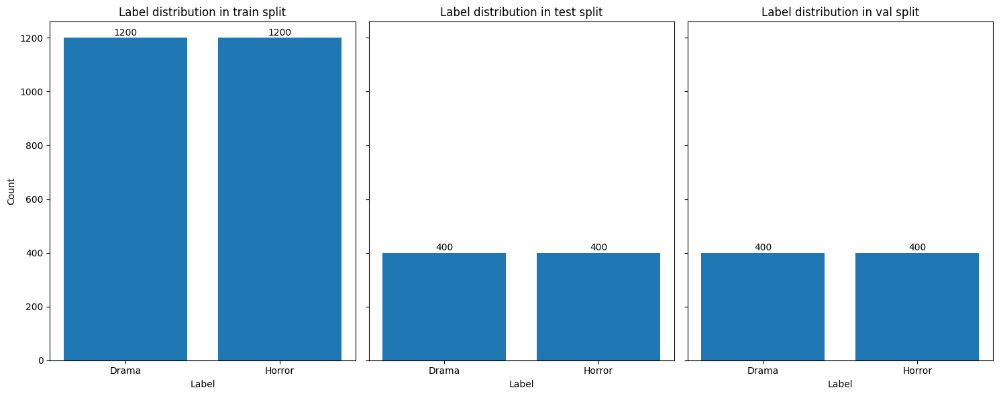

In [12]:
splits = [y_train, y_test, y_val]
names = ["train", "test", "val"]

fig, axes = plt.subplots(1, 3, figsize=(15, 6), sharey=True)

for ax, split, name in zip(axes, splits, names):
    counts = split.value_counts()
    labels = counts.index
    values = counts.values

    ax.bar(labels, values)
    ax.set_title(f"Label distribution in {name} split")
    for i, value in enumerate(values):
        ax.text(i, value + 0.5, str(value), ha='center', va='bottom')
    ax.set_xlabel("Label")
    if ax == axes[0]:
        ax.set_ylabel("Count")

plt.tight_layout()
plt.show()

Now we will see the first 5 images of each class in the training set

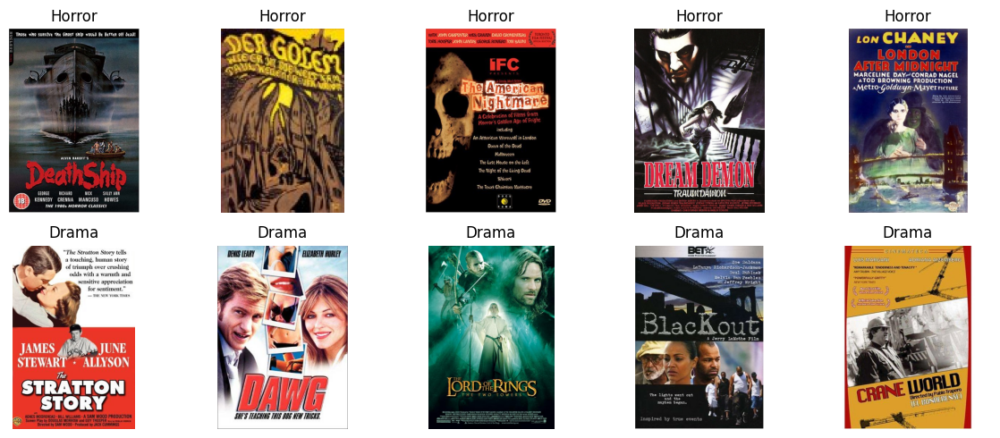

In [13]:
import matplotlib.pyplot as plt
from PIL import Image

image_paths_horror = X_train[y_train == "Horror"].head(5).tolist()
image_paths_drama = X_train[y_train == "Drama"].head(5).tolist()

plt.figure(figsize=(12, 5))
for i  in range(5):
    img_h = Image.open(image_paths_horror[i])
    img_d = Image.open(image_paths_drama[i])
    plt.subplot(2, 5, i + 1)
    plt.imshow(img_h)
    plt.title(f"Horror")
    plt.axis('off')
    plt.subplot(2, 5, 5 + i + 1)
    plt.imshow(img_d)
    plt.title(f"Drama")
    plt.axis('off')

plt.tight_layout()
plt.show()

Now we will look at the images and check two important factor that are needed for the model set up. This elements are:

1. Number of channles involved: 3 if images are RGB or 1 if images are black and white
2. Dimensions: The height and width of the images.

The idea is that all images have the same values of this factors in order to fix the neuronal network input

In [14]:
from PIL import Image
import warnings

def get_number_of_channels(image_path):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        try:
            with Image.open(image_path) as img:
                mode = img.mode
                channels = {
                    'RGB': 3,
                    'L': 1,
                    'RGBA': 4,
                    'CMYK': 4,
                    'P': 1
                }.get(mode)
                if channels is None:
                    print(f"⚠️ Unrecognized mode '{mode}' in file: {image_path}")
                return channels
        except Exception as e:
            print(f"❌ Could not open {image_path}: {e}")
            return None

def get_dimensions(image_path):
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        with Image.open(image_path) as img:
            return img.size

def check_images(paths, verbose = False, n = 500):
    n_c = []
    dims = []
    np = len(paths)
    for i,path in enumerate(paths):
        n_c.append(get_number_of_channels(path))
        dims.append(get_dimensions(path))
        if verbose:
          if (i+1)%n == 0:
            print(f"{i+1}/{np} images processed")
    if verbose and ((i+1)%len(paths))==1:
      print(f"{i+1}/{np} images processed")
    return n_c, dims

def stats(channels_list, dims_lists):
  c_l = np.array(channels_list)
  dims_l = np.array(dims_lists)
  unique , counts = np.unique(c_l, return_counts=True)
  print(f"Number of different channels configuration: {len(unique)}")
  for count, unique_value in zip(counts, unique):
    print(f"Number of images with {unique_value} channels: {count}")
  print()
  unique , counts = np.unique(dims_l, return_counts=True)
  print(f"Number of different dimensions configuration: {len(unique)}")

In [15]:
channels , dims = check_images(df['image_path'].values, verbose = True, n = 500)

500/4000 images processed
1000/4000 images processed
1500/4000 images processed
2000/4000 images processed
2500/4000 images processed
3000/4000 images processed
3500/4000 images processed
4000/4000 images processed


In [16]:
stats(channels, dims)

Number of different channels configuration: 3
Number of images with 1 channels: 18
Number of images with 3 channels: 3957
Number of images with 4 channels: 25

Number of different dimensions configuration: 1384


As we can see that most of the images have 3 channels, we will standarize the other images to let the full dataset to have three channels.

Also, we wil set image sizes to 224x224 as it is the standard value for Resnet models (This process will be done in the dataloader)

In [17]:
def ensure_rgb_in_place(image_path):
    try:
      with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        with Image.open(image_path) as img:
            if img.mode != "RGB":
                rgb_img = img.convert("RGB")
                rgb_img.save(image_path)
    except Exception as e:
        print(f"Error processing {image_path}: {e}")

def ensure_rgb_propagate(paths,verbose=False, n = 1000):
    for i,path in enumerate(paths):
        ensure_rgb_in_place(path)
        if verbose:
          if (i+1)%n == 0:
            print(f"{i+1}/{len(paths)} images processed")
    if verbose and ((i+1)%len(paths))==1:
      print(f"{i+1}/{len(paths)} images processed")

In [18]:
ensure_rgb_propagate(df['image_path'].values, verbose=True, n = 500)

500/4000 images processed
1000/4000 images processed
1500/4000 images processed
2000/4000 images processed
2500/4000 images processed
3000/4000 images processed
3500/4000 images processed
4000/4000 images processed


Now we can see that all the images are standarized to three channels

In [19]:
channels , dims = check_images(df['image_path'].values)
stats(channels, dims)

Number of different channels configuration: 1
Number of images with 3 channels: 4000

Number of different dimensions configuration: 1384


We make the tensorflow data loaders specifying the tensor shape to fix

In [20]:
df_train = pd.DataFrame({
    'image_path': X_train,
    'label': y_train})
df_test = pd.DataFrame({
    'image_path': X_test,
    'label': y_test})
df_val = pd.DataFrame({
    'image_path': X_val,
    'label': y_val})

In [21]:
train_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    horizontal_flip=True,
    rotation_range=20,
    zoom_range=0.2,
    width_shift_range=0.1,
    height_shift_range=0.1
)

test_val_datagen = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

In [22]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=df_train,
    x_col='image_path',
    y_col='label',
    class_mode='binary',
    target_size=(224, 224),
    shuffle=True)

test_generator = test_val_datagen.flow_from_dataframe(
    dataframe=df_test,
    x_col='image_path',
    y_col='label',
    class_mode='binary',
    target_size=(224, 224),
    shuffle = False)

val_generator = test_val_datagen.flow_from_dataframe(
    dataframe=df_val,
    x_col='image_path',
    y_col='label',
    class_mode='binary',
    target_size=(224, 224),
    shuffle = False)

Found 2400 validated image filenames belonging to 2 classes.
Found 800 validated image filenames belonging to 2 classes.
Found 800 validated image filenames belonging to 2 classes.


Now this data generators will be used to train and test our tensorflow model

## Exercise 2

Use a fine tuning approach to train a ResNet50 network to discriminate between drama and horror movies.

In [23]:
tf.keras.backend.clear_session()
print(tf.config.list_physical_devices('GPU'))

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


In [24]:
pre_trained_model = ResNet50(weights='imagenet',
                             include_top=False,
                             input_shape=(224, 224, 3),
                             classes = 2,
                             name = 'ResNet50 model')

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [31]:
def plot_history(history):
    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history.get('val_accuracy', []), label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.grid(True)

    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history.get('val_loss', []), label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)

    plt.tight_layout()
    plt.show()

def build_model(pre_trained_model, output=1):
    pre_trained_model.trainable = False

    last_layer = pre_trained_model.get_layer('conv5_block3_out')
    last_output = last_layer.output

    x = GlobalAveragePooling2D()(last_output)

    # Bloque 1
    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Bloque 2
    x = Dense(256, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Bloque 3
    x = Dense(128, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Bloque 4
    x = Dense(64, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Bloque 5
    x = Dense(32, activation='relu')(x)
    x = BatchNormalization()(x)
    x = Dropout(0.3)(x)

    # Capa de salida
    if output == 1:
        x = Dense(1, activation='sigmoid')(x)
    else:
        x = Dense(output, activation='softmax')(x)

    return x

In [36]:
model = build_model(pre_trained_model, output = 1)
model = Model(inputs=pre_trained_model.input, outputs=model)

In [37]:
model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,815,361 (94.66 MB)

 Trainable params: 1,225,665 (4.68 MB)

 Non-trainable params: 23,589,696 (89.99 MB)

In [38]:
model.compile(optimizer=Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

early_stopping = EarlyStopping(monitor='val_accuracy',
                               patience=20,
                               mode='max',
                               restore_best_weights=True)

In [39]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    history = model.fit(train_generator,
                        epochs=120,
                        validation_data=val_generator,
                        callbacks=[early_stopping],
                        batch_size=32,
                        verbose = 1)

Epoch 1/120
75/75 ━━━━━━━━━━━━━━━━━━━━ 83s 878ms/step - accuracy: 0.5589 - loss: 0.8253 - val_accuracy: 0.7212 - val_loss: 0.5643
Epoch 2/120
75/75 ━━━━━━━━━━━━━━━━━━━━ 61s 816ms/step - accuracy: 0.6890 - loss: 0.6414 - val_accuracy: 0.7038 - val_loss: 0.5883
Epoch 3/120
75/75 ━━━━━━━━━━━━━━━━━━━━ 61s 821ms/step - accuracy: 0.7199 - loss: 0.5739 - val_accuracy: 0.7450 - val_loss: 0.5621
Epoch 4/120
75/75 ━━━━━━━━━━━━━━━━━━━━ 61s 821ms/step - accuracy: 0.7252 - loss: 0.5631 - val_accuracy: 0.7412 - val_loss: 0.5565
Epoch 5/120
75/75 ━━━━━━━━━━━━━━━━━━━━ 62s 827ms/step - accuracy: 0.7648 - loss: 0.4920 - val_accuracy: 0.7500 - val_loss: 0.5488
Epoch 6/120
75/75 ━━━━━━━━━━━━━━━━━━━━ 62s 822ms/step - accuracy: 0.7503 - loss: 0.5139 - val_accuracy: 0.7375 - val_loss: 0.5682
Epoch 7/120
75/75 ━━━━━━━━━━━━━━━━━━━━ 61s 813ms/step - accuracy: 0.7859 - loss: 0.4701 - val_accuracy: 0.7525 - val_loss: 0.5479
Epoch 8/120
75/75 ━━━━━━━━━━━━━━━━━━━━ 62s 829ms/step - accuracy: 0.7686 - loss: 0.4923 - 

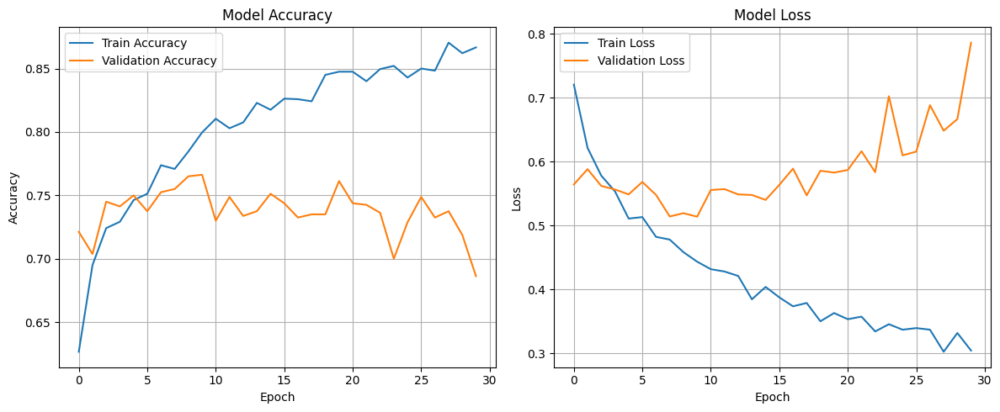

In [40]:
plot_history(history)

In [41]:
model.save('model.h5')

In [42]:
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  predictions = model.predict(test_generator)

25/25 ━━━━━━━━━━━━━━━━━━━━ 13s 361ms/step


In [43]:
predicted_classes_base_model = np.where(predictions > 0.5, 1, 0)
test_real_classes = np.array(test_generator.classes)

Now we will take our trained model and apply fine tunning in order to improve the performance

In [46]:
def unfreeze_base_model(model, base_model_name='ResNet50 model', trainable_layers_from=0):

    for layer in model.layers[-trainable_layers_from:]:
        layer.trainable = True

    print(f"Descongeladas las ultimas {trainable_layers_from} capas ")
    return model

We unfreeze the last 25 layers of the base model

In [47]:
unfreezed_model = unfreeze_base_model(model, trainable_layers_from=50)

Descongeladas las ultimas 50 capas 


In [48]:
unfreezed_model.compile(optimizer=Adam(learning_rate=1e-6),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [49]:
unfreezed_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 24,815,361 (94.66 MB)

 Trainable params: 16,201,665 (61.80 MB)

 Non-trainable params: 8,613,696 (32.86 MB)

In [50]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    history = unfreezed_model.fit(train_generator,
                                  epochs=10,
                                  validation_data=val_generator,
                                  batch_size=32,
                                  verbose = 1)

Epoch 1/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 92s 870ms/step - accuracy: 0.7944 - loss: 0.4406 - val_accuracy: 0.7700 - val_loss: 0.5052
Epoch 2/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 61s 815ms/step - accuracy: 0.8020 - loss: 0.4262 - val_accuracy: 0.7613 - val_loss: 0.5080
Epoch 3/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 62s 823ms/step - accuracy: 0.7878 - loss: 0.4393 - val_accuracy: 0.7688 - val_loss: 0.5080
Epoch 4/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 62s 830ms/step - accuracy: 0.7858 - loss: 0.4392 - val_accuracy: 0.7688 - val_loss: 0.5072
Epoch 5/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 66s 890ms/step - accuracy: 0.8116 - loss: 0.4205 - val_accuracy: 0.7688 - val_loss: 0.5076
Epoch 6/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 61s 815ms/step - accuracy: 0.8084 - loss: 0.4283 - val_accuracy: 0.7675 - val_loss: 0.5080
Epoch 7/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 64s 852ms/step - accuracy: 0.8095 - loss: 0.4228 - val_accuracy: 0.7700 - val_loss: 0.5076
Epoch 8/10
75/75 ━━━━━━━━━━━━━━━━━━━━ 62s 825ms/step - accuracy: 0.8186 - loss: 0.4117 - val_accu

In [51]:
unfreezed_model.save('model_fine_tunned.h5')

We make the predictions and get the model performance

In [52]:
with warnings.catch_warnings():
  warnings.simplefilter("ignore")
  predictions_fn = unfreezed_model.predict(test_generator)

25/25 ━━━━━━━━━━━━━━━━━━━━ 14s 401ms/step


In [53]:
predicted_classes_unfreezed_model = np.where(predictions_fn > 0.5, 1, 0)
test_real_classes = np.array(test_generator.classes)

## Exercise 3

Evaluate the model over the test dataset. Discuss the results

We see the performance of the first model (The one that applied only transfer learning)

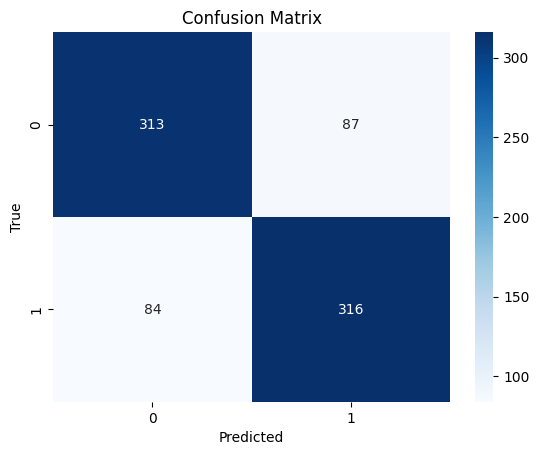

In [75]:
cmp = confusion_matrix(test_real_classes, predicted_classes_base_model.flatten())

sns.heatmap(cmp, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [76]:
print(classification_report(test_real_classes, predicted_classes_base_model.flatten()))

              precision    recall  f1-score   support

           0       0.79      0.78      0.79       400
           1       0.78      0.79      0.79       400

    accuracy                           0.79       800
   macro avg       0.79      0.79      0.79       800
weighted avg       0.79      0.79      0.79       800



Now we see the performance of the model where fine tuning was applied

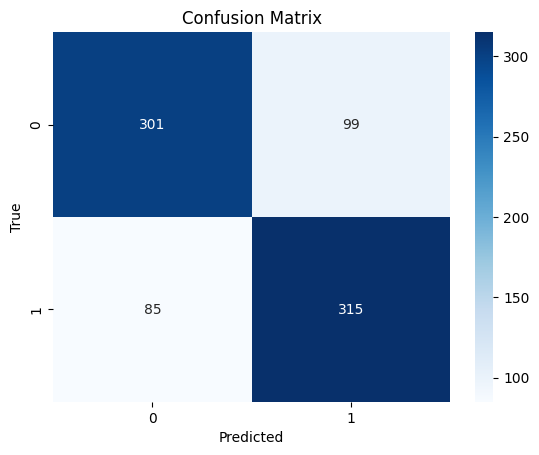

In [77]:
cmp = confusion_matrix(test_real_classes, predicted_classes_unfreezed_model.flatten())

sns.heatmap(cmp, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [82]:
print(classification_report(test_real_classes, predicted_classes_unfreezed_model.flatten()))

              precision    recall  f1-score   support

           0       0.78      0.75      0.77       400
           1       0.76      0.79      0.77       400

    accuracy                           0.77       800
   macro avg       0.77      0.77      0.77       800
weighted avg       0.77      0.77      0.77       800



Now we will take the models and check the first 15 missclassified samples

In [83]:
def oposite_label(label):
    return "Drama" if label == "Horror" else "Horror"

#### Model with transfer learning

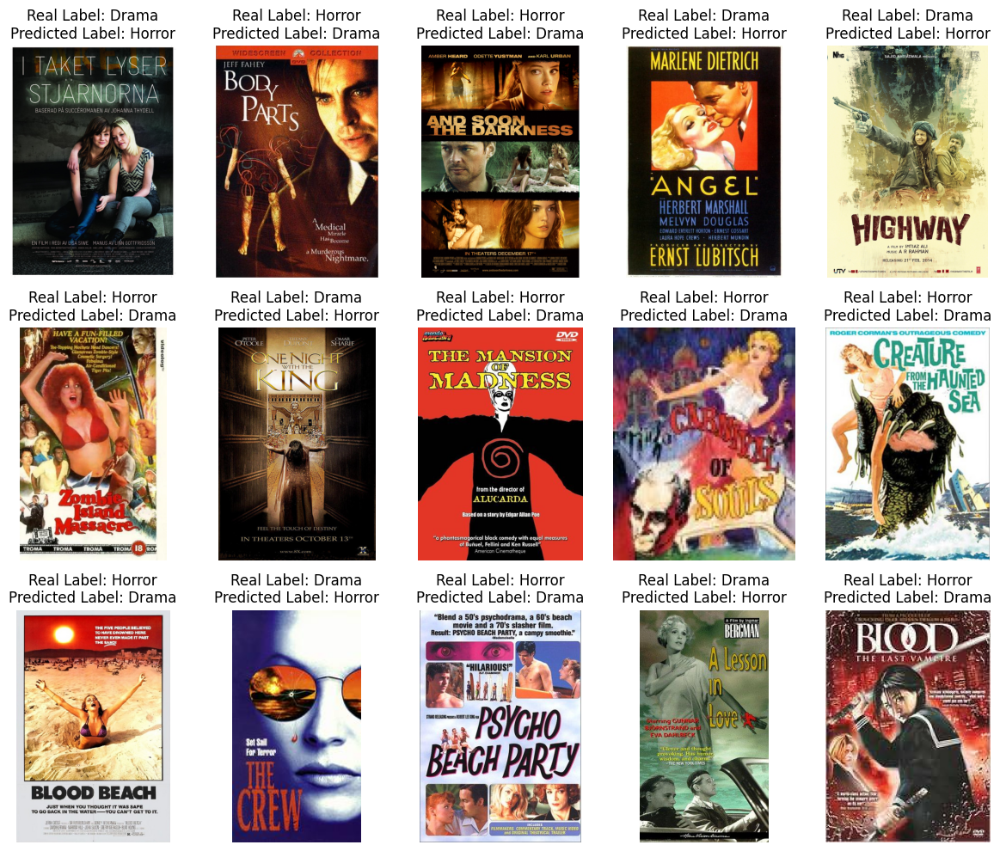

In [88]:
filter = test_real_classes != predicted_classes_base_model.flatten()

plt.figure(figsize=(12, 10))
for i, (image, label) in enumerate(zip(X_test[filter][:15], y_test[filter][:15])):
    img = Image.open(image)
    plt.subplot(3, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Real Label: {label}\nPredicted Label: {oposite_label(label)}")
    plt.axis('off')

plt.tight_layout()
plt.show()

#### Model with fine tuning

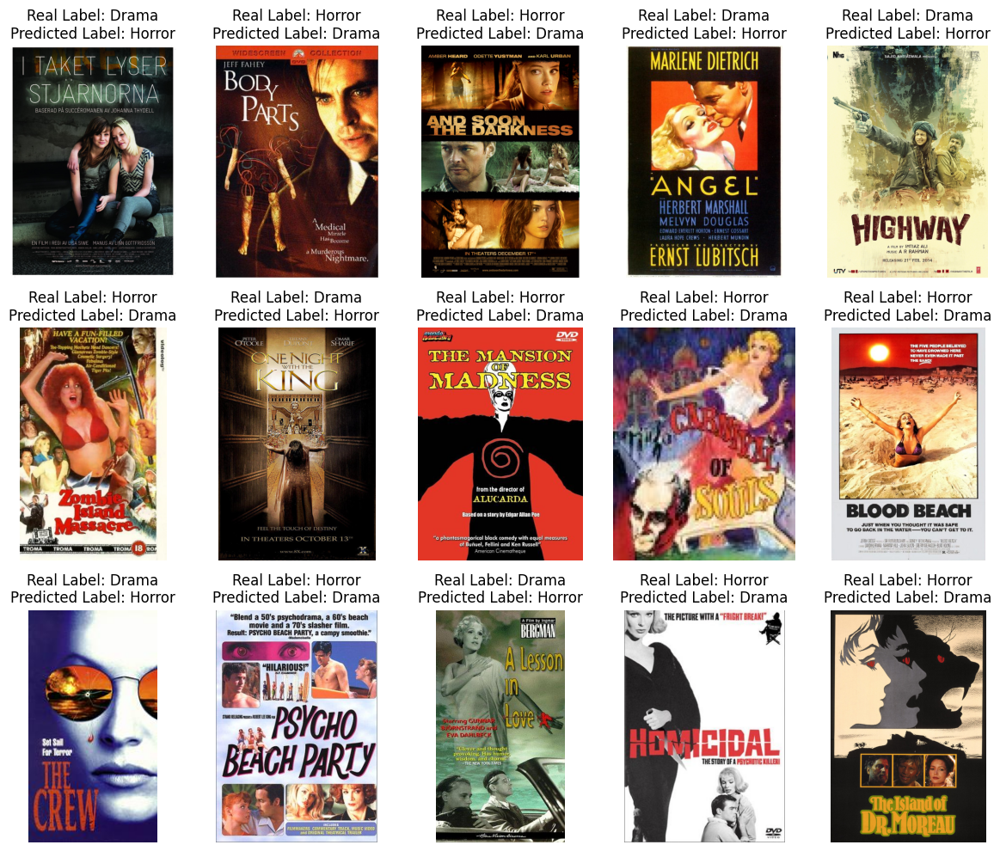

In [89]:
filter = test_real_classes != predicted_classes_unfreezed_model.flatten()

plt.figure(figsize=(12, 10))
for i, (image, label) in enumerate(zip(X_test[filter][:15], y_test[filter][:15])):
    img = Image.open(image)
    plt.subplot(3, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Real Label: {label}\nPredicted Label: {oposite_label(label)}")
    plt.axis('off')

plt.tight_layout()
plt.show()

As we can see, most of the missclasified images were missclasified by both models, then we will attempt to see with samples were missclassified by the first model and not by the second one and viceverse

In [90]:
missclassified_by_first_model = test_real_classes != predicted_classes_base_model.flatten()
missclassified_by_second_model = test_real_classes != predicted_classes_unfreezed_model.flatten()

missclasified_by_both = missclassified_by_first_model & missclassified_by_second_model
missclasified_by_one_not_by_the_second = missclassified_by_first_model & ~missclassified_by_second_model
missclasified_by_second_not_by_the_first = ~missclassified_by_first_model & missclassified_by_second_model

print(f"Number of missclassified images by both models: {missclasified_by_both.sum()}")
print(f"Number of missclassified images by the first model and not by the second: {missclasified_by_one_not_by_the_second.sum()}")
print(f"Number of missclassified images by the second model and not by the first: {missclasified_by_second_not_by_the_first.sum()}")

Number of missclassified images by both models: 141
Number of missclassified images by the first model and not by the second: 30
Number of missclassified images by the second model and not by the first: 43


We will check the first 10 images of each of the sets identified

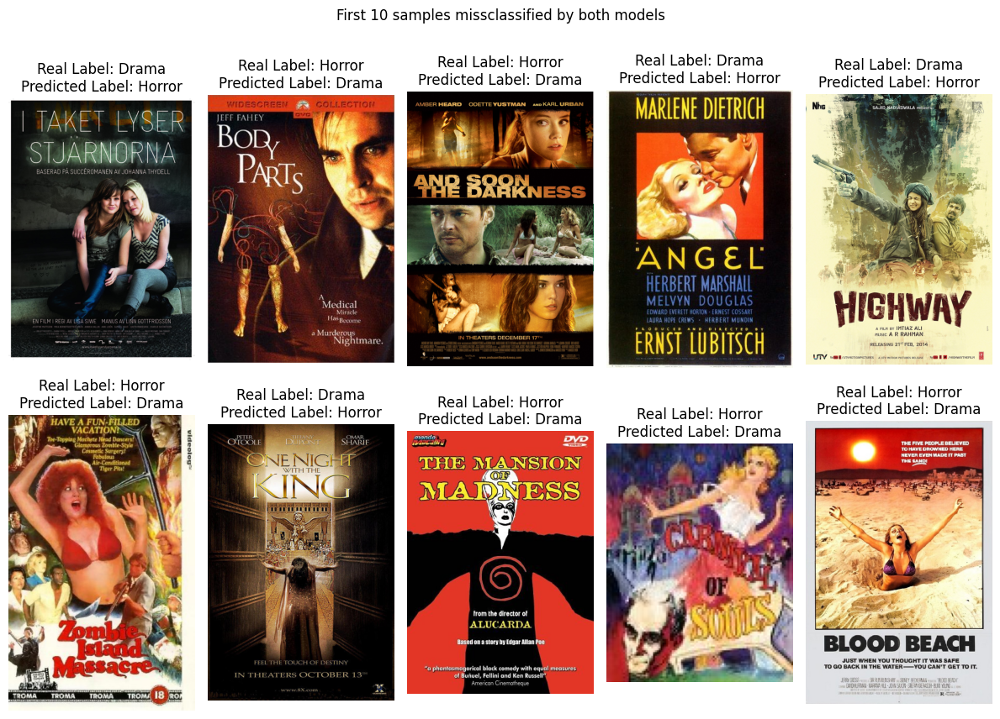

In [97]:
filter = missclasified_by_both

plt.figure(figsize=(12, 9))
for i, (image, label) in enumerate(zip(X_test[filter][:10], y_test[filter][:10])):
    img = Image.open(image)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Real Label: {label}\nPredicted Label: {oposite_label(label)}")
    plt.axis('off')
plt.suptitle("First 10 samples missclassified by both models\n")
plt.tight_layout()
plt.show()

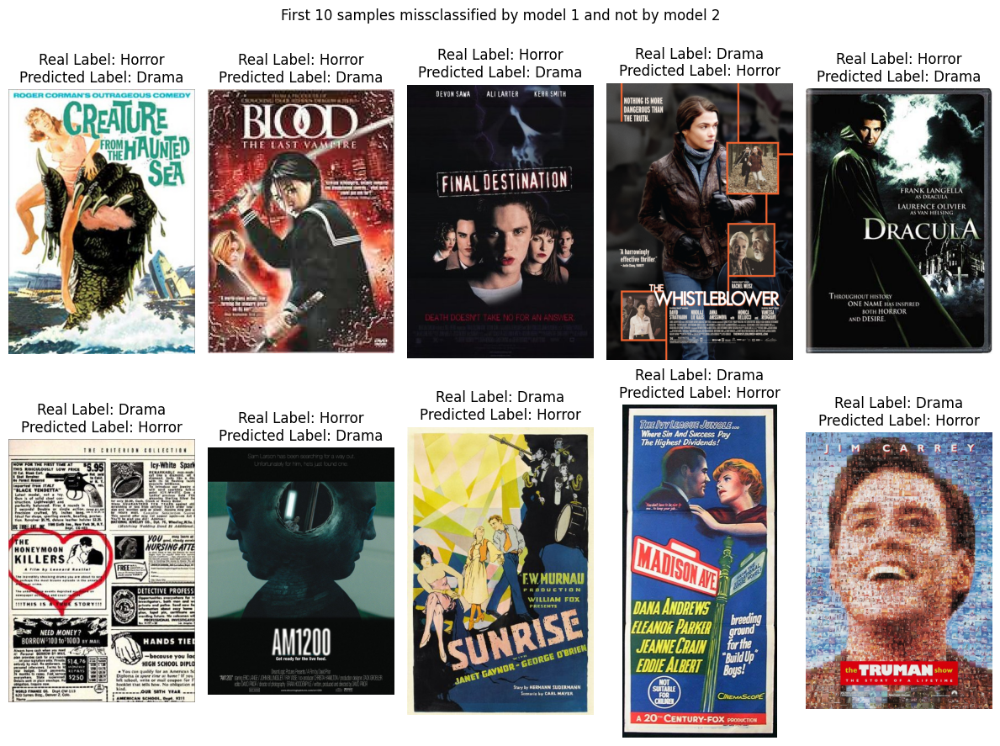

In [98]:
filter = missclasified_by_one_not_by_the_second

plt.figure(figsize=(12, 9))
for i, (image, label) in enumerate(zip(X_test[filter][:10], y_test[filter][:10])):
    img = Image.open(image)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Real Label: {label}\nPredicted Label: {oposite_label(label)}")
    plt.axis('off')
plt.suptitle("First 10 samples missclassified by model 1 and not by model 2\n")
plt.tight_layout()
plt.show()

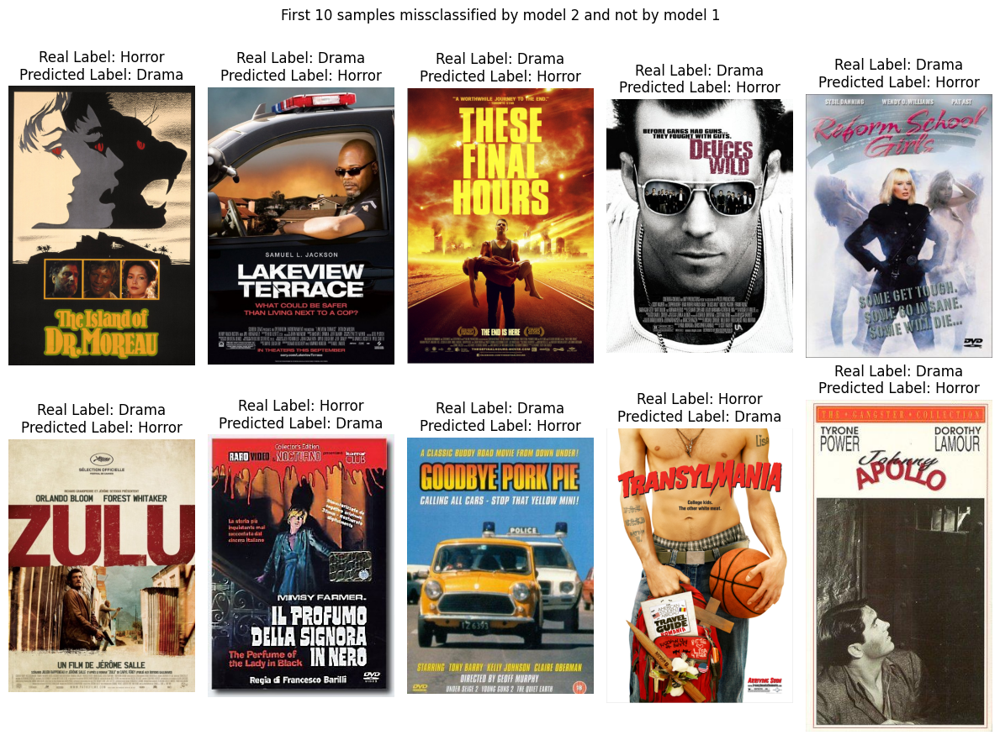

In [99]:
filter = missclasified_by_second_not_by_the_first

plt.figure(figsize=(12, 9))
for i, (image, label) in enumerate(zip(X_test[filter][:10], y_test[filter][:10])):
    img = Image.open(image)
    plt.subplot(2, 5, i + 1)
    plt.imshow(img)
    plt.title(f"Real Label: {label}\nPredicted Label: {oposite_label(label)}")
    plt.axis('off')
plt.suptitle("First 10 samples missclassified by model 2 and not by model 1\n")
plt.tight_layout()
plt.show()